In [499]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# Import files and Processing

Incorporate resistance values

In [500]:
R = 30000

Import and standardize units from {mV, V} $\to$ V

In [501]:
df = pd.read_csv('15c_data_04_12.csv')
df.columns = ['Freq', 'VPP', 'Ch1', 'Ch1 Unit', 'Ch2', 'Ch2 Unit', 'Phase', 'Index', 'Notes']

#Units
vals = {'mV':0.001, 'V':1,}
df['Ch1'] = df['Ch1']*df['Ch1 Unit'].map(vals)
df['Ch2'] = df['Ch2']*df['Ch2 Unit'].map(vals)
# Turn degrees into radians
df['Phase'] = df['Phase']*2*np.pi/360
df.drop(columns=['Ch1 Unit', 'Ch2 Unit'], inplace=True)

# Capacitance estimation one in nanofarads
df['C1'] = (2*np.pi*df['Freq']*R*np.sqrt((df['Ch1']**2)/(df['Ch2']**2)-1))**(-1)*1e9
# Capacitance estimation two in nanofarads
df['C2'] = (2*np.pi*df['Freq']*R*np.tan(df['Phase']))**(-1)*1e9

df

,Freq,VPP,Ch1,Ch2,Phase,Index,Notes,C1,C2
0,100,1.0,0.96,0.624,0.069813,0.0,NaN,45.377048,758.673908
1,100,6.0,5.68,3.760,0.087266,1.0,NaN,46.854371,606.383108
2,100,11.0,10.64,6.960,0.069813,2.0,NaN,45.880472,758.673908
3,100,16.0,15.40,10.000,0.052360,3.0,NaN,45.298637,1012.285741
4,300,1.0,0.96,0.632,-0.034907,5.0,NaN,15.466293,-506.400140
...,...,...,...,...,...,...,...,...,...
110,10,16.0,15.36,10.480,0.013823,108.0,NaN,495.112617,38376.791753
111,50,1.0,0.96,0.648,0.043633,110.0,NaN,97.069671,2430.165002
112,50,6.0,5.68,3.840,0.037699,111.0,NaN,97.349273,2813.143864
113,50,11.0,10.64,7.120,0.048869,112.0,NaN,95.546780,2169.439551


In [502]:
# Fixed frequency data
freqs = np.sort(df.Freq.unique())

fixed_freq_exp = {}

for freq in freqs:
    important_cols = ['VPP', 'Ch1', 'Ch2', 'Phase', 'Index', "C1", "C2"]
    if np.isnan(freq):
        print('nan frequency found. Skipping')
        continue
    if df[df['Freq'] == freq][important_cols].isna().any().any():
        print(f"NaN values found for frequency {freq}. Skipping")
        continue
    res = df.loc[df['Freq'] == freq][important_cols].sort_values(by = 'VPP')
    fixed_freq_exp[freq] = res

# Fixed voltage data
VPPs = np.sort(df.VPP.unique())
fixed_voltage_exp = {}
for voltage in VPPs:
    important_cols = ['Freq', 'Ch1', 'Ch2', 'Phase', 'Index',"C1", "C2"]
    if np.isnan(voltage):
        print('nan voltage found. Skipping')
        continue
    if df[df['VPP'] == voltage][important_cols].isna().any().any():
        print(f"NaN values found for voltage {voltage}. Skipping")
        continue
    res = df.loc[df['VPP'] == voltage][important_cols].sort_values(by = 'Freq')
    fixed_voltage_exp[voltage] = res


NaN values found for frequency 400000. Skipping
NaN values found for frequency 500000. Skipping
NaN values found for frequency 900000. Skipping
nan voltage found. Skipping


In [503]:

def plot_exps(exp_dict, x_col_name, y_col_names1, y_col_names2=None, styles1='g-o', styles2='r-o', 
              controlled_var_name="Controlled variable: ", unit="", ncol=1, height=15, width=12, 
              dpi=300, logx=False, logy1=False, logy2=False, xlabel="", ylabel1="", ylabel2="", 
              hspace=0.5, wspace=0.2, markersize=5, dashed_fn_1 = None, dashed_fn_2 = None):
    
    nrow = int(np.ceil(len(exp_dict) / ncol))
    plt.rcParams['figure.dpi'] = dpi
    plt.rcParams["figure.figsize"] = (width, height)
    plt.style.use('dark_background')
    
    fig, axes1 = plt.subplots(nrow, ncol, squeeze=False)
    if y_col_names2 is not None:
        axes2 = [ax.twinx() for ax_row in axes1 for ax in ax_row]

    count = 0
    for ind_var, data in exp_dict.items():
        r = count // ncol
        c = count % ncol
        ax1 = axes1[r, c]
        ax1.set_title(f"{controlled_var_name}: {ind_var} {unit}")
        ax1.set_xlabel(xlabel)
        ax1.set_ylabel(ylabel1)
        data.plot(x=x_col_name, y=y_col_names1, style=styles1, logx=logx, logy=logy1, 
                  markersize=markersize, ax=ax1, legend=True)
        xvals = np.linspace(np.min(data[x_col_name]), np.max(data[x_col_name]), 50)
        if dashed_fn_1 is not None:
            f_vals_1 = [dashed_fn_1(x, ind_var) for x in xvals]
            ax1.plot(xvals, f_vals_1, linestyle='--', color='white')

        ax1.legend(loc='upper left') 
    
        if y_col_names2 is not None:
            ax2 = axes2[count]
            ax2.set_xlabel(xlabel)
            ax2.set_ylabel(ylabel2)
            data.plot(x=x_col_name, y=y_col_names2, style=styles2, logx=logx, logy=logy2, 
                      markersize=markersize, ax=ax2, legend=True)
            ax2.legend(loc='upper right')  
    
        if dashed_fn_2 is not None:
            f_vals_2 = [dashed_fn_2(x , ind_var) for x in xvals]
            ax2.plot(xvals, f_vals_2, linestyle='--', color='white')
        

        count += 1

    plt.subplots_adjust(hspace=hspace, wspace=wspace)  
    plt.show()



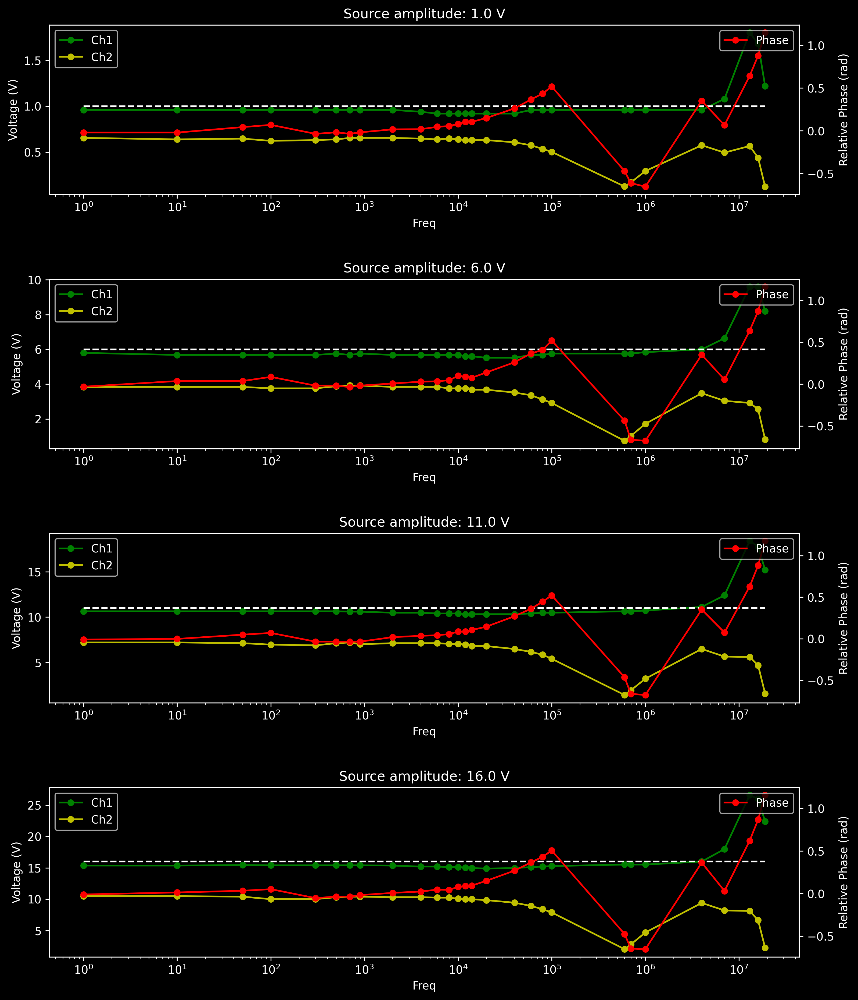

In [504]:
plot_exps(fixed_voltage_exp, "Freq", ["Ch1", "Ch2"], styles1 = ['g-o', 'y-o'], controlled_var_name= "Source amplitude", unit= "V", logx=True, logy1=False, xlabel= "Source Frequency (Hz)", ylabel1="Voltage (V)", ncol = 1, y_col_names2='Phase', ylabel2="Relative Phase (rad)", dashed_fn_1 = (lambda x, v: v))

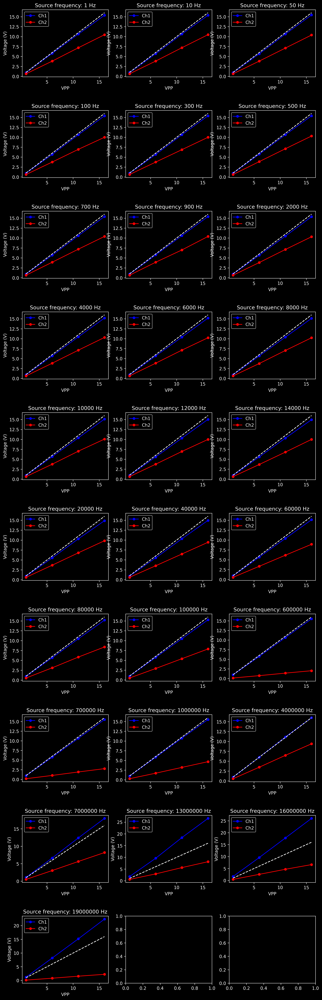

In [512]:
plot_exps(fixed_freq_exp, "VPP", ["Ch1", "Ch2"], styles1 = ['b-o', 'r-o'], controlled_var_name= "Source frequency", unit= "Hz", logx=False, logy1=False, xlabel= "Source Amplitude (V)", ylabel1="Voltage (V)", ncol = 3, height=40, dashed_fn_1 = (lambda x, f: x))

# Estimations of Capacitance

We'll estimate capacitance using both the definition in terms of the phase, as well as the ratio of voltage amplitudes

In [513]:
fixed_voltage_exp[1]

,Freq,Ch1,Ch2,Phase,Index,C1,C2
103,1,0.96,0.656,-0.020141,101.0,4965.297175,-263364.339229
107,10,0.96,0.640,-0.020071,105.0,474.508362,-26428.063646
111,50,0.96,0.648,0.043633,110.0,97.069671,2430.165002
0,100,0.96,0.624,0.069813,0.0,45.377048,758.673908
4,300,0.96,0.632,-0.034907,5.0,15.466293,-506.400140
8,500,0.96,0.640,-0.017453,8.0,9.490167,-607.865372
12,700,0.96,0.656,-0.034907,12.0,7.093282,-217.028632
16,900,0.96,0.656,-0.017453,16.0,5.516997,-337.702985
20,2000,0.96,0.656,0.017453,20.0,2.482649,151.966343
24,4000,0.94,0.648,0.019199,24.0,1.262110,69.074137


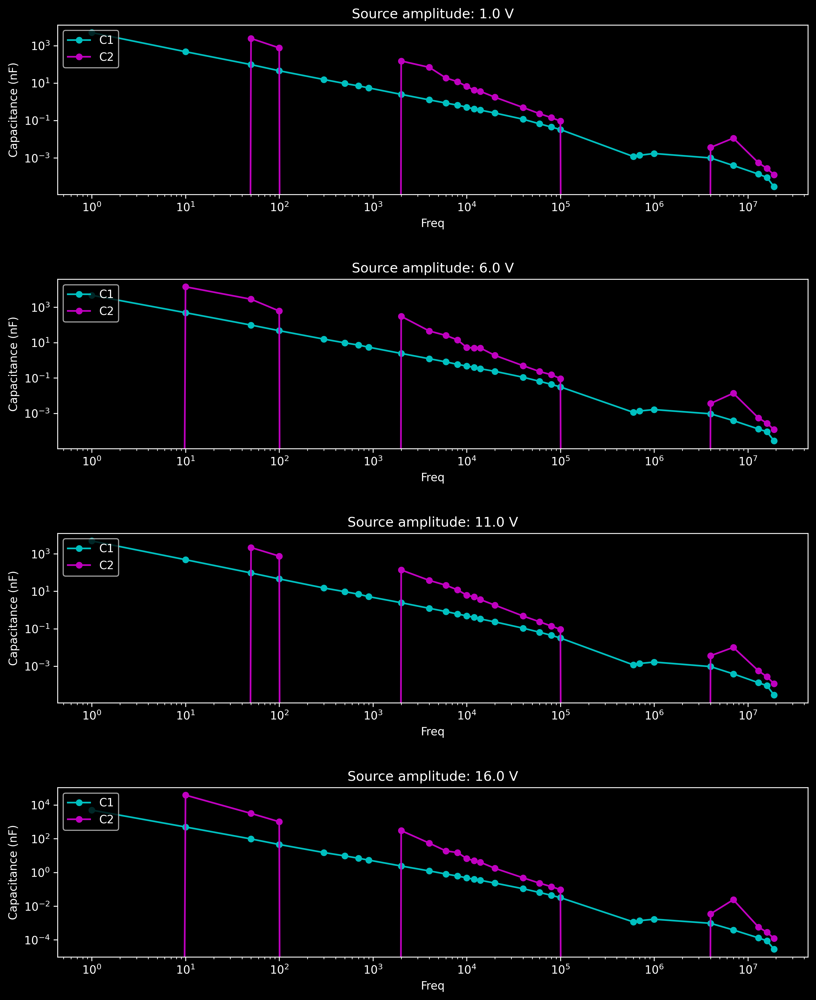

In [514]:
plot_exps(fixed_voltage_exp, "Freq", ["C1", 'C2'], styles1 = ['c-o', 'm-o'], controlled_var_name= "Source amplitude", unit= "V", logx=True, logy1=True, xlabel= "Source Frequency (Hz)", ylabel1="Capacitance (nF)", ncol = 1, logy2=True, styles2="m")

Note that while the calculation one is steadily decreasing and well defined for all points, having a negative measured phase difference implies the circuit is not capacitive, and is instead more inductive.  This doesn't make sense unless there is truly another effect going on. Note that, in the above graph, that would entail a negative capacitance, so it shoots down to negative infinity in the log scale (it's complex!)

To investigate this further, we first rule out bad phase measurements (as the oscilloscope's reading was extremely variable). Instead, we'll compute the phase differences manually. 

But first, let's plot the same for the fixed frequency experiments. 

#

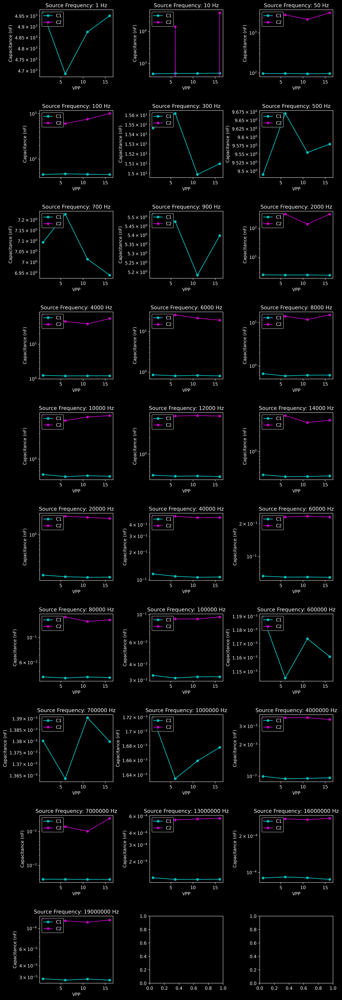

In [508]:
plot_exps(fixed_freq_exp, "VPP", ["C1", "C2"], styles1 = ['c-o', 'm-o'], controlled_var_name= "Source Frequency", unit= "Hz", logx=False, logy1=True, xlabel= "Source Amplitude (V)", ylabel1="Capacitance (nF)",  ncol = 3, height=40, wspace=0.5)

# Direct analysis of signals

In [509]:
import pandas as pd
import numpy as np
import os

# Directory where your CSV files are stored
data_directory = './capacitor_data_0412'
file_template = "TEK{:05d}.CSV"


# Function to load data from a CSV file
def load_data(file_index):
    file_path = os.path.join(data_directory, file_template.format(file_index))
    data = pd.read_csv(file_path, skiprows=15)  # Adjust 'skiprows' as necessary to skip header
    return data

In [539]:
load_data(3)

,TIME,CH1,CH2
0,-0.03200,-7.0,-4.88
1,-0.03197,-7.0,-4.80
2,-0.03194,-7.0,-4.80
3,-0.03190,-7.0,-4.80
4,-0.03187,-6.8,-4.72
...,...,...,...
1995,0.03184,7.4,4.48
1996,0.03187,7.4,4.56
1997,0.03190,7.4,4.64
1998,0.03194,7.6,4.64


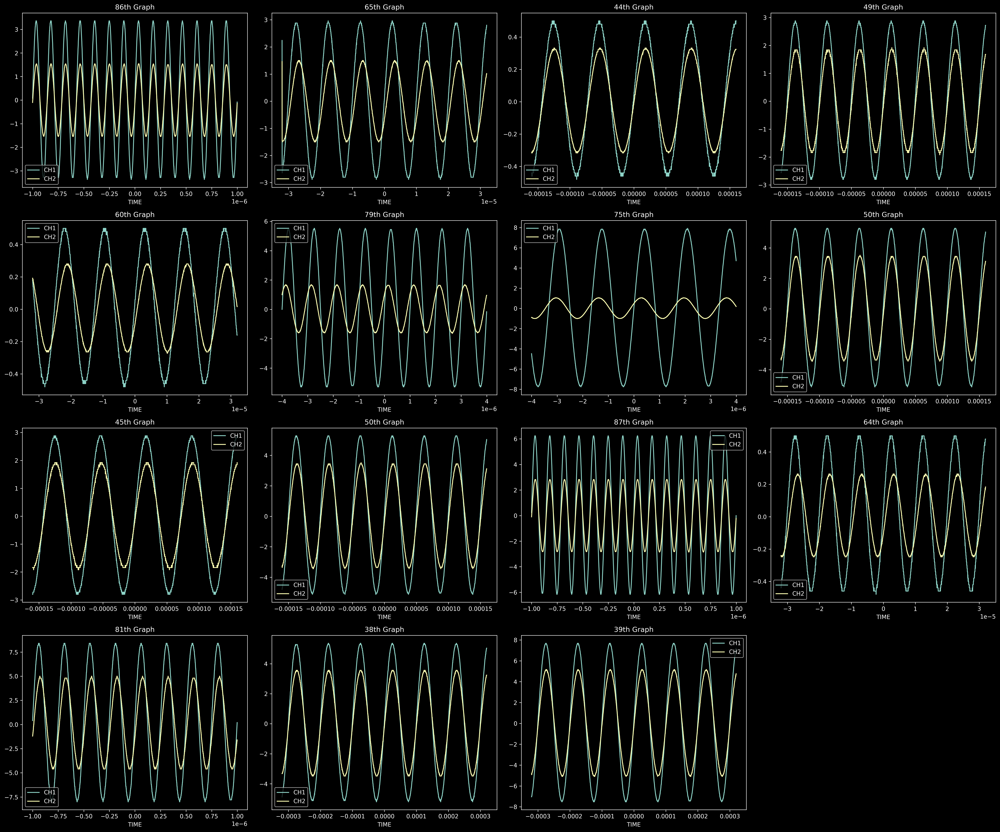

In [515]:


# Generate random indices for the graphs
n = 15  # number of graphs
w = 4   # number of columns in subplot
fig, ax = plt.subplots(int(np.ceil(n / w)), w, figsize=(6 * w, 5 * int(np.ceil(n / w))))
ax = ax.flatten()  # Flatten the axes array for easier indexing

k_vals = [int(x) for x in np.floor(np.random.random_sample(n) * 112)]
data_list = [load_data(k) for k in k_vals]

# Plot each graph on its corresponding subplot
for i, (k_val, data_ex) in enumerate(zip(k_vals, data_list)):
    data_ex.plot(x='TIME', y=['CH1', 'CH2'], title=f"{k_val}th Graph", ax=ax[i])
    ax[i].legend(['CH1', 'CH2'])

# Disable unused axes if any
if n % w != 0:
    for j in range(i + 1, len(ax)):
        ax[j].axis('off')

# Show the plot
plt.tight_layout()
plt.show()


In [547]:
from scipy.optimize import curve_fit
from scipy.fftpack import fft, fftfreq

def estimate_phase_difference(data):
    # Extract time and channel data
    t = data['TIME'].values
    ch1 = data['CH1'].values
    ch2 = data['CH2'].values
    
    # Function to fit
    def model(t, A, f, phi):
        return A * np.cos(2 * np.pi * f * t + phi)
    
    # Estimate dominant frequency using FFT for channel 1 (similar can be done for ch2 if needed)
    fft_vals = fft(ch1)
    fft_freq = fftfreq(len(t), t[1] - t[0])
    dominant_freq = fft_freq[np.argmax(np.abs(fft_vals[1:len(fft_vals)//2]))]  # Ignore zero freq
    
    # Fit the model to both channels
    popt1, _ = curve_fit(model, t, ch1, p0=[np.max(ch1), dominant_freq, 0])
    popt2, _ = curve_fit(model, t, ch2, p0=[np.max(ch2), dominant_freq, 0])
    
    # Extract phases
    phase_ch1 = popt1[2]
    phase_ch2 = popt2[2]
    
    # Calculate phase difference
    phase_difference = (phase_ch2 - phase_ch1) % (2 * np.pi)
    if phase_difference > np.pi:
        phase_difference -= 2 * np.pi
    
    return phase_difference


# Applying the calculation to each file index
df['Phase-2'] = df['Index'].dropna().apply(lambda x: estimate_phase_difference(load_data(int(x))))
# Capacitance estimation three (with correct phase delta values) in nanofarads
df['C3'] = (2*np.pi*df['Freq']*R*np.tan(df['Phase-2']))**(-1)*1e9


We compare how bad our phase measurements are. 

In [549]:
# Fixed voltage data
VPPs = np.sort(df.VPP.unique())
fixed_voltage_exp_new = {}
for voltage in VPPs:
    important_cols = ['Freq', 'Ch1', 'Ch2', 'Phase', 'Index',"C1", "C3","Phase-2"]
    if np.isnan(voltage):
        print('nan voltage found. Skipping')
        continue
    if df[df['VPP'] == voltage][important_cols].isna().any().any():
        print(f"NaN values found for voltage {voltage}. Skipping")
        continue
    res = df.loc[df['VPP'] == voltage][important_cols].sort_values(by = 'Freq')
    fixed_voltage_exp_new[voltage] = res


# Fixed frequency data
freqs = np.sort(df.Freq.unique())

fixed_freq_exp_new = {}

for freq in freqs:
    important_cols = ['VPP', 'Ch1', 'Ch2', 'Phase', 'Index', "C1", "C3","Phase-2"]
    if np.isnan(freq):
        print('nan frequency found. Skipping')
        continue
    if df[df['Freq'] == freq][important_cols].isna().any().any():
        print(f"NaN values found for frequency {freq}. Skipping")
        continue
    res = df.loc[df['Freq'] == freq][important_cols].sort_values(by = 'VPP')
    fixed_freq_exp_new[freq] = res



nan voltage found. Skipping
NaN values found for frequency 400000. Skipping
NaN values found for frequency 500000. Skipping
NaN values found for frequency 900000. Skipping


In [550]:
max(df['Phase-2'])

3.1323306920286917

Doesn't make sense to have such a high phase difference. Should be bounded by pi. 

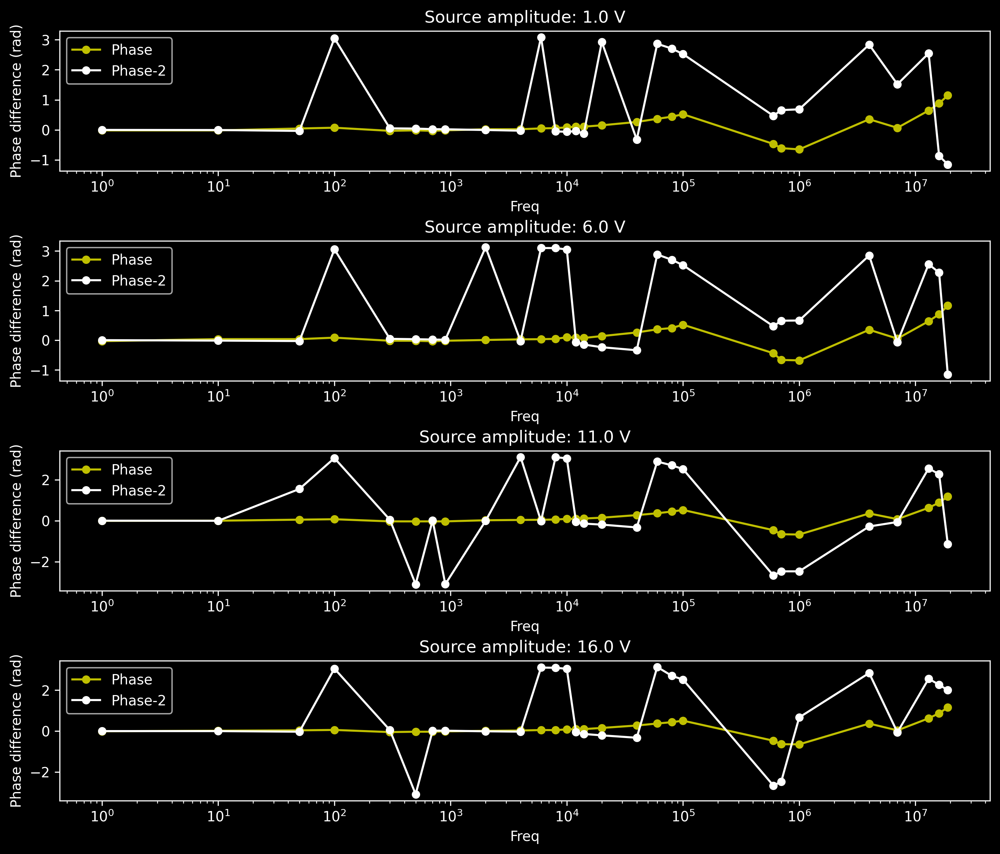

In [553]:
plot_exps(fixed_voltage_exp_new, "Freq", ["Phase", "Phase-2"], styles1 = ['y-o', 'w-o'], controlled_var_name= "Source amplitude", unit= "V", logx=True, logy1=False, xlabel= "Source Frequency (Hz)", ylabel1="Phase difference (rad)", ncol = 1, height=10)

We see there are big divergences between the data reporrted by the oscilloscope and the calculated values using Python. Therefore, we shall now recalculate the graphs from above

Compute how capacitance reached through values of $V_2, V_1$ compares to capacitance based on $\tan(\delta)$

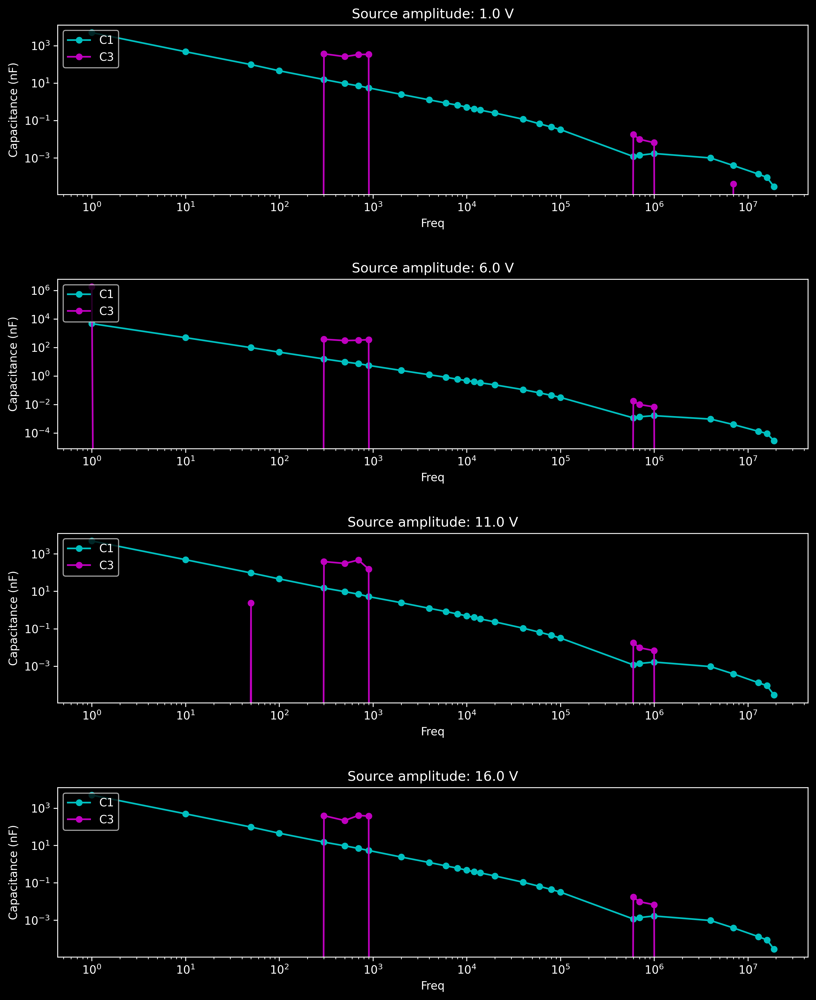

In [558]:
plot_exps(fixed_voltage_exp_new, "Freq", ["C1", 'C3'], styles1 = ['c-o', 'm-o'], controlled_var_name= "Source amplitude", unit= "V", logx=True, logy1=True, xlabel= "Source Frequency (Hz)", ylabel1="Capacitance (nF)", ncol = 1, logy2=True, styles2="m")

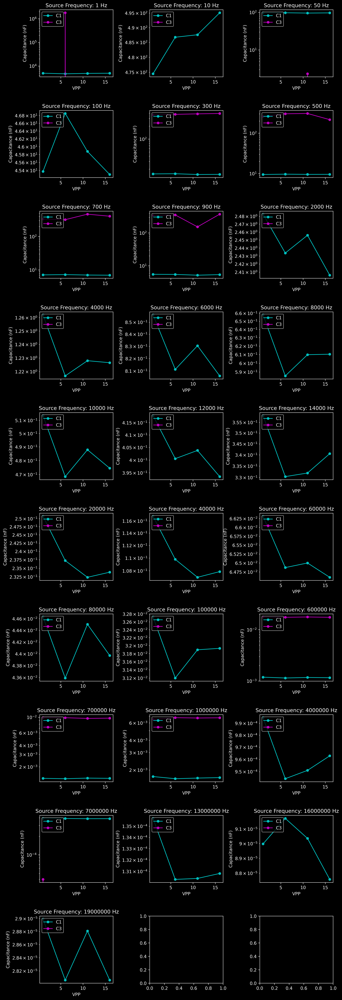

In [556]:
plot_exps(fixed_freq_exp_new, "VPP", ["C1", "C3"], styles1 = ['c-o', 'm-o'], controlled_var_name= "Source Frequency", unit= "Hz", logx=False, logy1=True, xlabel= "Source Amplitude (V)", ylabel1="Capacitance (nF)",  ncol = 3, height=40, wspace=0.5)

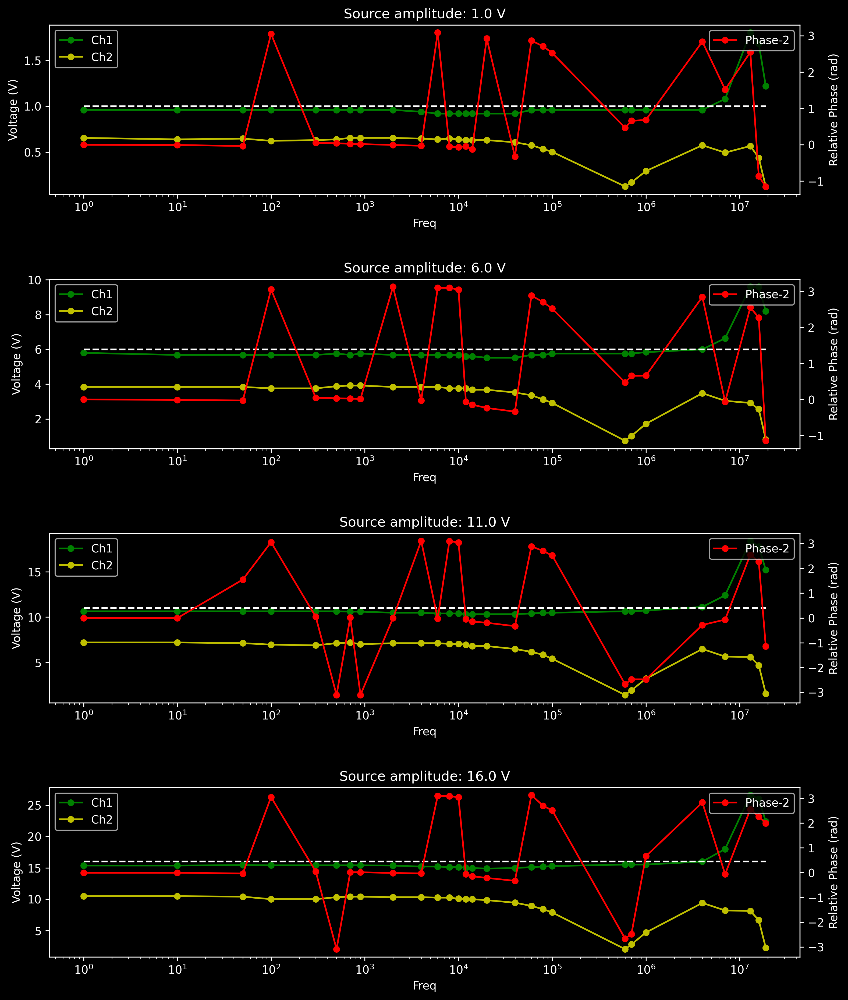

In [557]:
plot_exps(fixed_voltage_exp_new, "Freq", ["Ch1", "Ch2"], styles1 = ['g-o', 'y-o'], controlled_var_name= "Source amplitude", unit= "V", logx=True, logy1=False, xlabel= "Source Frequency (Hz)", ylabel1="Voltage (V)", ncol = 1, y_col_names2='Phase-2', ylabel2="Relative Phase (rad)", dashed_fn_1 = (lambda x, v: v))